# **IMDB Dataset Analysis**

This dataset contains 50,000 highly polar movie reviews for analysis. There is additional unlabeled data for use as well. We will use that unlabeled data later for Unsupervised analysis. 


Uploading file every time at colab takes time and slows down the flow. So, I have uploaded the data file at Google Drive and accessing the csv file from there. 

In [2]:
!pip install PyDrive

In [0]:
import os
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [0]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
download = drive.CreateFile({'id': '1hhP2-Z9qwiMk8tJO0UZcrLgT4bI9Pick'})
download.GetContentFile('sup_df.csv')

In [0]:
import pandas as pd

# reading file into a DataFrame
df = pd.read_csv('sup_df.csv')

In [7]:
df.head()

,Unnamed: 0,review,label
0,0,The Five Deadly Venoms is a great kung-fu acti...,pos
1,1,Intrigued by the synopsis (every gay video the...,neg
2,2,"Okay, just by reading the title you would thin...",neg
3,3,"I don't know the stars, or modern Chinese teen...",pos
4,4,One wonders why anyone would try to rehash suc...,neg


In [0]:
# dropping the irrelevent column from the dataframe
df = df.drop('Unnamed: 0',axis=1)

The real world is filled with text data and is usually messy hence cleaning and handling text is an important step towards making smarter Machine Learning algorithms. IMDB dataset is one of such usual messy data set which hides a lot of information under the hood which is awaiting to be discovered.

In [0]:
# Cleaning of Data
# Converting every letter to lowercase and removing <br /> tag

df['review'] = df['review'].str.lower().str.replace('<br />','')

In [0]:
# removing the numbers from the Data .

df['review'] = df['review'].str.replace('[0-9]', ' ')

In [0]:
# removing punctuation marks and spliting the data into list of words

punctuations = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''

def pun(ph):
    ph_1 = ""
    for i in ph:
        if i not in punctuations:
            ph_1 += i
    return ph_1

df['review'] = df['review'].apply(lambda x : pun(x)).str.split()

In [12]:
# removing all stopwords

import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

df['review'] = df['review'].apply(lambda x : [word for word in x if word not in set(stopwords.words('english'))])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [0]:
# Stemming and Lemmatization 

from nltk.stem.porter import PorterStemmer
ps = PorterStemmer()

In [0]:
df['review'] = df['review'].apply(lambda x: [ps.stem(word) for word in x])

In [0]:
from nltk.stem import WordNetLemmatizer
wl = WordNetLemmatizer()

In [16]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [0]:
df['review'] = df['review'].apply(lambda x: ' '.join([wl.lemmatize(word) for word in x]))

In [0]:
#df.to_csv('df.csv')

In [0]:
#upload = drive.CreateFile({'title': 'df.csv'})
#upload.SetContentFile('df.csv')
#upload.Upload()

In [0]:
#download = drive.CreateFile({'id': '1TELBmpf82zIfxyyy_wTqvgPcScvUkXP3'})
#download.GetContentFile('df.csv')

In [0]:
#import pandas as pd

#df = pd.read_csv('df.csv')

In [0]:
#df.head()

In [0]:
#df = df.drop('Unnamed: 0',axis=1)

In [0]:
# applying CountVectorizer on the data to convert every important word as a feature 

from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(max_features = 10000)

In [0]:
cv_array = cv.fit_transform(df.review).toarray()
cv_names = cv.get_feature_names()
X = pd.DataFrame(cv_array, columns=cv_names)

In [21]:
X.head()

,aamir,aaron,ab,abandon,abba,abbey,abbi,abbot,abbott,abc,...,zoe,zoey,zombi,zone,zoo,zoom,zorro,zu,zucco,zucker
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

Y = le.fit_transform(df.label)
Y

array([1, 0, 0, ..., 1, 1, 1])

In [23]:
le.classes_

array(['neg', 'pos'], dtype=object)

In [24]:
y = pd.DataFrame(data=Y,columns=['label'])
y.head()

,label
0,1
1,0
2,0
3,1
4,0


Proceeding with such big dimension would be a complex idea. So, here i am applying Feature Selection technique to pick only important and relevent features for further analysis.

In [25]:
# Feature selection

from sklearn.ensemble import ExtraTreesClassifier
tree_clf = ExtraTreesClassifier()
tree_clf.fit(X, y)

tree_clf.feature_importances_

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


array([5.48661988e-05, 3.83691120e-05, 1.71287717e-05, ...,
       2.05301221e-05, 0.00000000e+00, 0.00000000e+00])

In [26]:
importances = tree_clf.feature_importances_
feature_names = X.columns.tolist()
#feature_names
feature_imp_dir = dict(zip(feature_names, importances))
features = sorted(feature_imp_dir.items(), key=lambda x: x[1], reverse=True)
#feature_imp_dir

# printing top five important feature words with their importance calculated.

features[:5]

[('bad', 0.01394752311875853),
 ('aw', 0.008853333287335854),
 ('worst', 0.008830638898724487),
 ('wast', 0.008276669291545413),
 ('great', 0.008091704918480153)]

In [0]:
import matplotlib.pyplot as plt

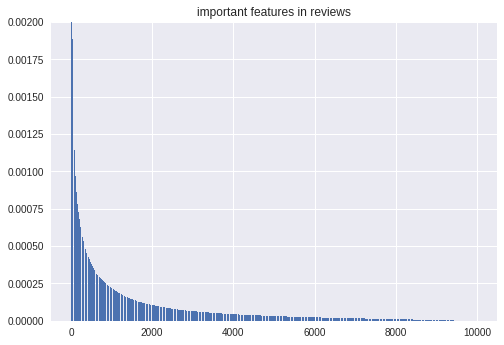

In [28]:
plt.bar(range(len(features)), [imp[1] for imp in features], align='center')
plt.ylim(0,0.002)
plt.title('important features in reviews');

In [29]:
import numpy as np
from sklearn.feature_selection import SelectFromModel
abc = SelectFromModel(tree_clf, prefit = True)
x_updated = abc.transform(X)
print('Total Features count:', np.array(X).shape[1])
print('Selected Features: ' ,np.array(x_updated).shape[1])

Total Features count: 10000
Selected Features:  2114


In [30]:
x_updated

array([[0, 0, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 2, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [31]:
feature_idx = abc.get_support()
feature_n = X.columns[feature_idx]
feature_n

Index(['abandon', 'abil', 'abl', 'absolut', 'absorb', 'absurd', 'abus',
       'abysm', 'academi', 'accent',
       ...
       'york', 'youd', 'youll', 'young', 'younger', 'your', 'youth', 'youv',
       'zero', 'zombi'],
      dtype='object', length=2114)

In [0]:
X_Update = pd.DataFrame(x_updated,columns=feature_n)

IMDB holds sentiments of a bunch of people which can give away a lot of insights about the movie itself, understanding such sentiments can boost any production house income. 

Let's look into the data more deeply and try to undersand the line between the classifications.

In [0]:
# Exploration

from wordcloud import WordCloud

In [34]:
# collecting all the words associated with Positive Category into a list.

pos_list = df[df["label"] == "pos"]["review"].unique().tolist()
pos_list[:2]

['five deadli venom great kungfu action movi wrap whodunnit mysteri usual telltal sign kungfu flick great choreographi aw dub differ style fight wide rang greatli exagger often cheesey human emot howev plot certainli better averag interest hold attent throughout nonfight scene occasion even abl fire audienc x charact receiv horribl injusticeanoth thing love five deadli venom beauti simplic movi moral theme everyon get what come cowardli greedi corrupt lose bad guy consum selfish greed ultim destroy treacheri backstab good guy use teamwork plan integr overcom odd come top poison clan rock',
 'dont know star modern chine teenag music know thoroughli entertain movi see onekung fu dunk pure hollywood valu play laugh love great blend kung fu basketballeverybodi look like lot fun make product valu excel modern china look glossier lo angel hereth plot abandon orphan grow kung fu school kick discov superstardom basketbal play love etc great fresh fun immens entertainingwith great action good d

In [35]:
pos = " ".join(pos_list)
pos[:100]

'five deadli venom great kungfu action movi wrap whodunnit mysteri usual telltal sign kungfu flick gr'

In [36]:
POS = []
for i in pos.split():
  if i in feature_n:
    POS.append(i)
Pos = " ".join(POS)
Pos

'five great action movi mysteri usual sign flick great aw dub differ style fight wide rang often human emot howev plot certainli better averag interest hold attent throughout scene occasion even abl fire audienc charact receiv horribl thing love five beauti movi moral theme everyon get what come corrupt lose bad guy ultim destroy good guy use plan overcom odd come top rock dont know star modern teenag music know thoroughli entertain movi see pure hollywood valu play laugh love great blend look like lot fun make product valu excel modern china look angel plot abandon grow school kick discov play love etc great fresh fun immens great action good dialogu one simpli enjoy age money one best famili movi seen long ignor neg review give chanc realli glad good comedi movi read book base other film role last work john one hope hilari almost everi time he present matter fact cast support well regular play well materi tend great play paul father three teenag typic guy age depress fight caus awar 

In [0]:
# collecting all the words associated with Negative Category into a list.

neg_list = df[df["label"] == "neg"]["review"].unique().tolist()
neg = " ".join(neg_list)

NEG = []
for i in neg.split():
  if i in feature_n:
    NEG.append(i)
Neg = " ".join(NEG)

In [0]:
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


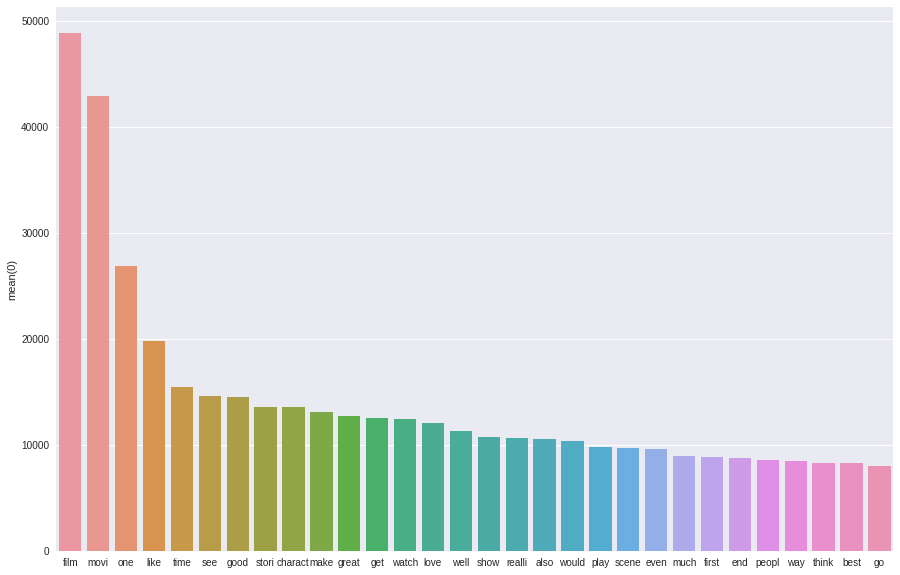

In [39]:
plt.subplots(figsize=(15,10))
sns.barplot(x = pd.DataFrame(pos.split())[0].value_counts().index[:30], y = pd.DataFrame(pos.split())[0].value_counts()[:30])

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


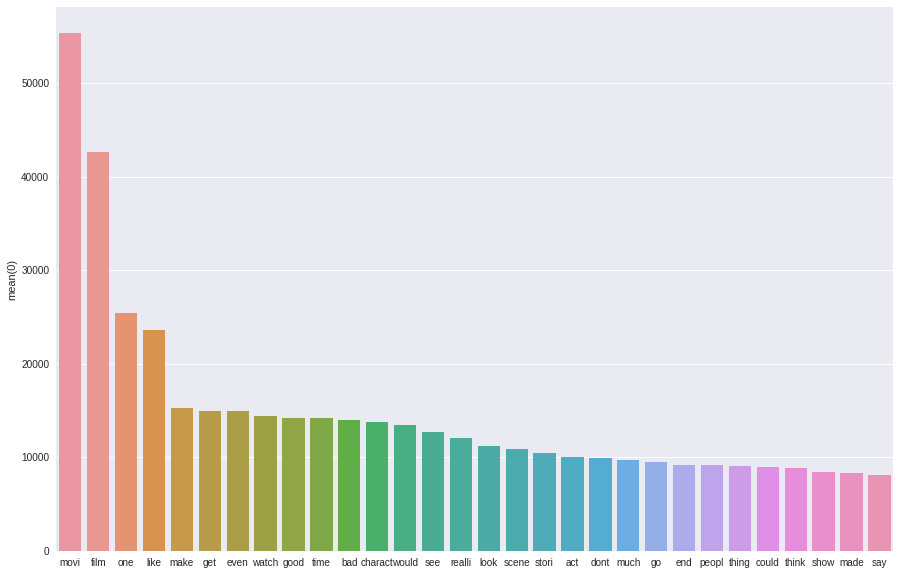

In [40]:
plt.subplots(figsize=(15,10))
sns.barplot(x = pd.DataFrame(neg.split())[0].value_counts().index[:30], y = pd.DataFrame(neg.split())[0].value_counts()[:30])

In [0]:
common = []
for i in POS:
  if i in NEG:
    common.append(i)

common = set(common)

In [0]:
#common

In [0]:
# ploting a wordcloud for both the categories

pos_wordcloud = WordCloud().generate(Pos)
neg_wordcloud = WordCloud().generate(Neg)

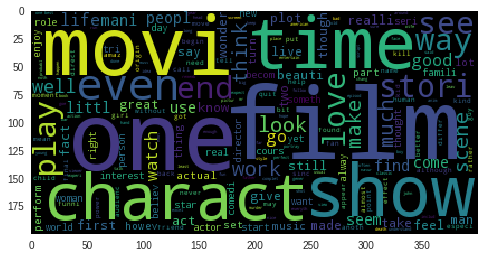

In [44]:
plt.figure()
plt.grid(False)
plt.imshow(pos_wordcloud)
plt.show()

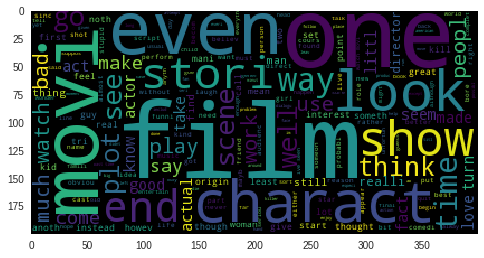

In [45]:
plt.figure()
plt.grid(False)
plt.imshow(neg_wordcloud)
plt.show()

The maximum and minimum occuring words in both categories.

In [46]:
max(pos_wordcloud.words_,key=pos_wordcloud.words_.get)

'film'

In [47]:
min(pos_wordcloud.words_,key=pos_wordcloud.words_.get)

'boy'

In [48]:
max(neg_wordcloud.words_,key=neg_wordcloud.words_.get)

'film'

In [49]:
min(neg_wordcloud.words_,key=neg_wordcloud.words_.get)

'help'

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


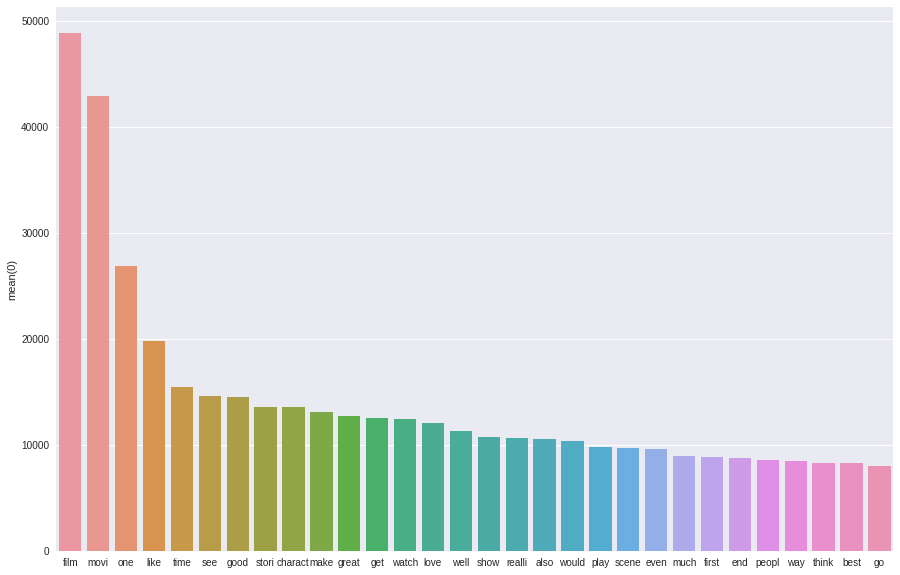

In [50]:
plt.subplots(figsize=(15,10))
#sns.countplot(POS)
sns.barplot(x = pd.DataFrame(POS)[0].value_counts().index[:30], y = pd.DataFrame(POS)[0].value_counts()[:30])

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


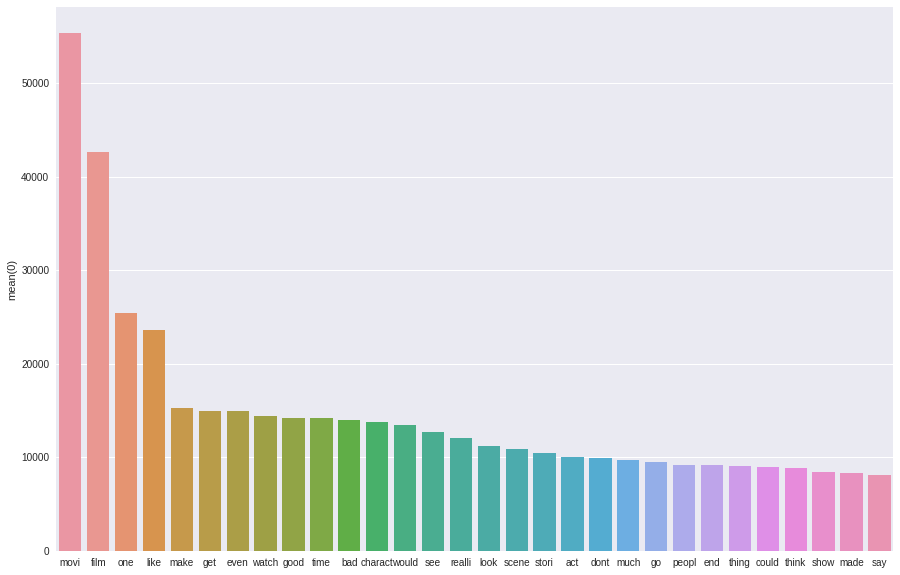

In [51]:
#sns.countplot(NEG)
plt.subplots(figsize=(15,10))
sns.barplot(x = pd.DataFrame(NEG)[0].value_counts().index[:30], y = pd.DataFrame(NEG)[0].value_counts()[:30])

The derived information can be very useful in building customized recommendations for users based on their reviews. And these models can be used to find unhappy customers, the reason for dissatisfaction and so on. Sentiment analysis is a great tool for the same.

Here, we need to classify the reviews into positive and negative sentiments thus classifying the movies having the most good reviews.

In [0]:
# import Naive bayes classifier
from sklearn.naive_bayes import MultinomialNB

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_Update, y, test_size=0.25, random_state=0)


In [55]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
predictions = clf.predict(X_test)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [56]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, predictions)
accuracy

0.84248

In [0]:
# Decision Tree Classifier

from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(criterion='gini')

In [58]:
clf.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [0]:
predictions = clf.predict(X_test)

In [60]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, predictions)
accuracy

0.72536

In [0]:
# Random Forest Classifier

from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=5)

In [62]:
clf.fit(X_train, y_train)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=5, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [0]:
# predict the outcome for testing data
predictions = clf.predict(X_test)

In [64]:
# check the accuracy of the model
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, predictions)
accuracy

0.7592

I applied Naive Bayes, Decision Tree and Random Forest Classifier for building the model. After calculating the accuracy for each model, Naive Bayes is giving the highest accuracy of 84%.

This accuracy may drop as we introduce some new data. Well, this is how our model learns ; )